# Data Exercise Photometry 

File: phot_00.fits
  EXPTIME: 120.0
  GAIN: 1.62
  Aperture Radius: 15
  Annulus: 25 - 35
  Instrumental Magnitude: 36.926
  Magnitude Error (Estimate): 0.001
  Sky Background (per pixel): 2508.359
------------------------------


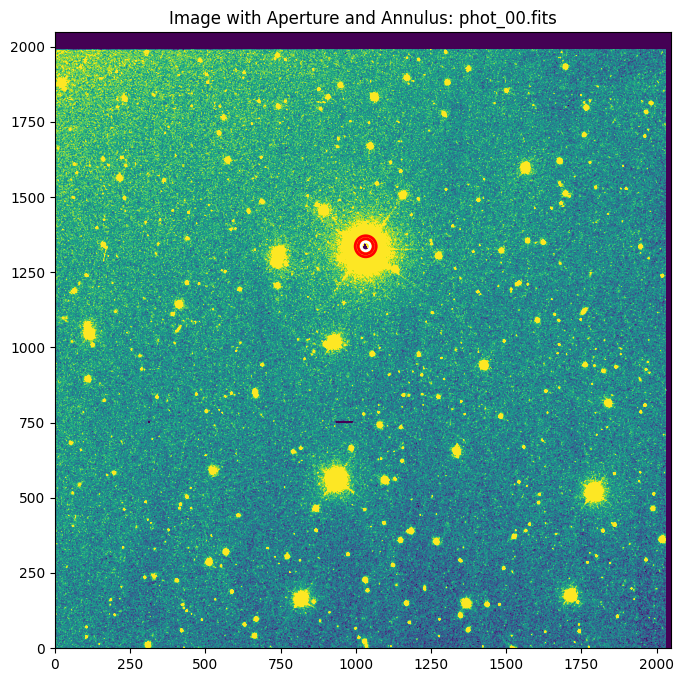

File: phot_01.fits
  Sky Background (per pixel): 2301.915
------------------------------


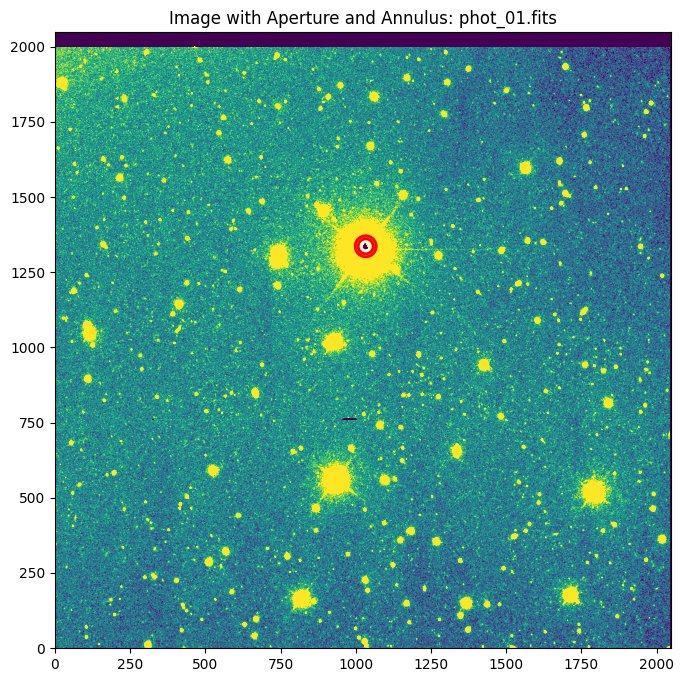

File: phot_02.fits
  Sky Background (per pixel): 3376.919
------------------------------


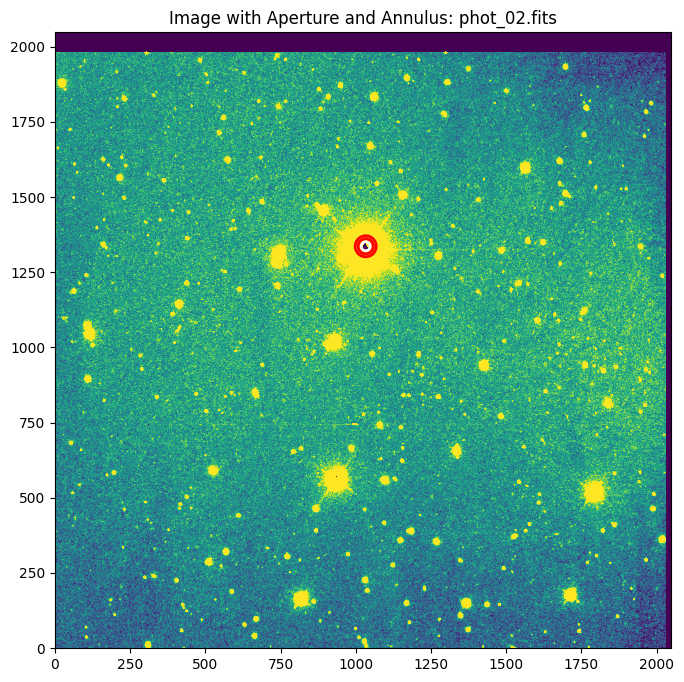

File: phot_03.fits
  Sky Background (per pixel): 3880.157
------------------------------


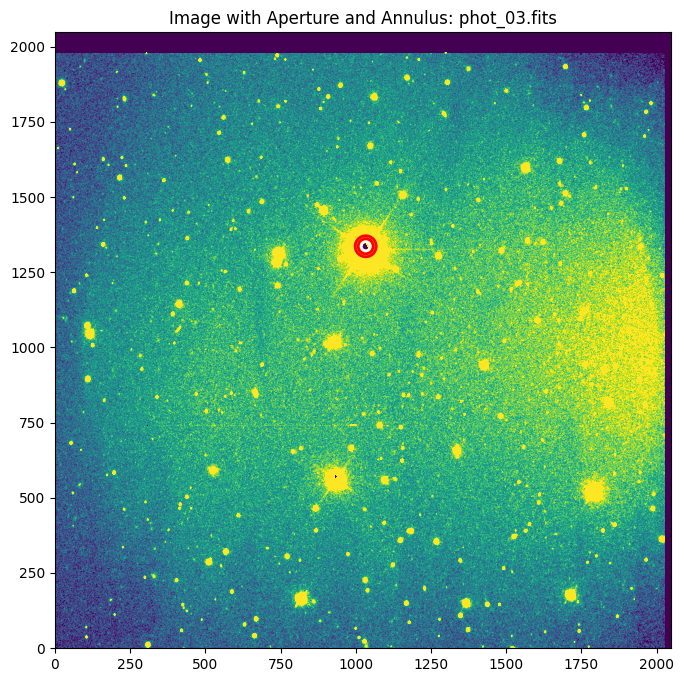

File: phot_04.fits
  EXPTIME: 120.0
  GAIN: 1.62
  Aperture Radius: 15
  Annulus: 25 - 35
  Instrumental Magnitude: 35.284
  Magnitude Error (Estimate): 0.001
  Sky Background (per pixel): 6317.388
------------------------------


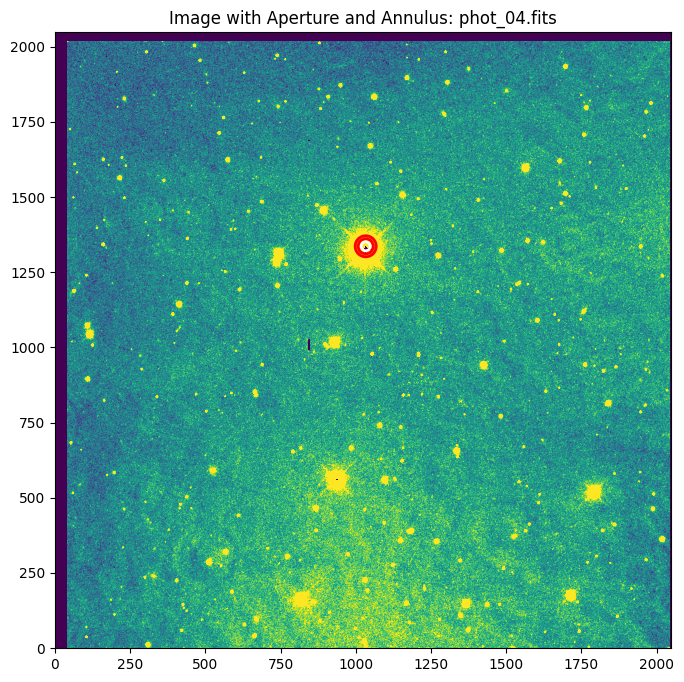

File: phot_05.fits
  Sky Background (per pixel): 4114.138
------------------------------


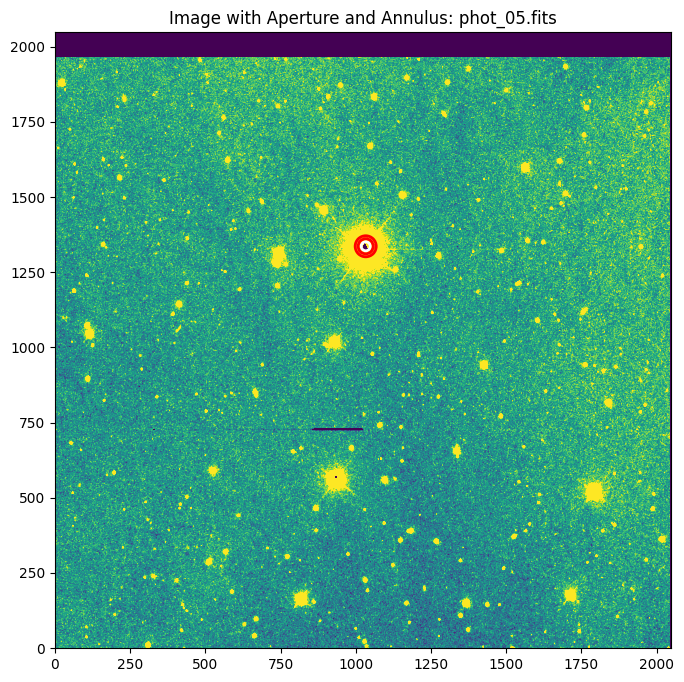

File: phot_06.fits
  EXPTIME: 120.0
  GAIN: 1.62
  Aperture Radius: 15
  Annulus: 25 - 35
  Instrumental Magnitude: 33.077
  Magnitude Error (Estimate): 0.000
  Sky Background (per pixel): 1753.979
------------------------------


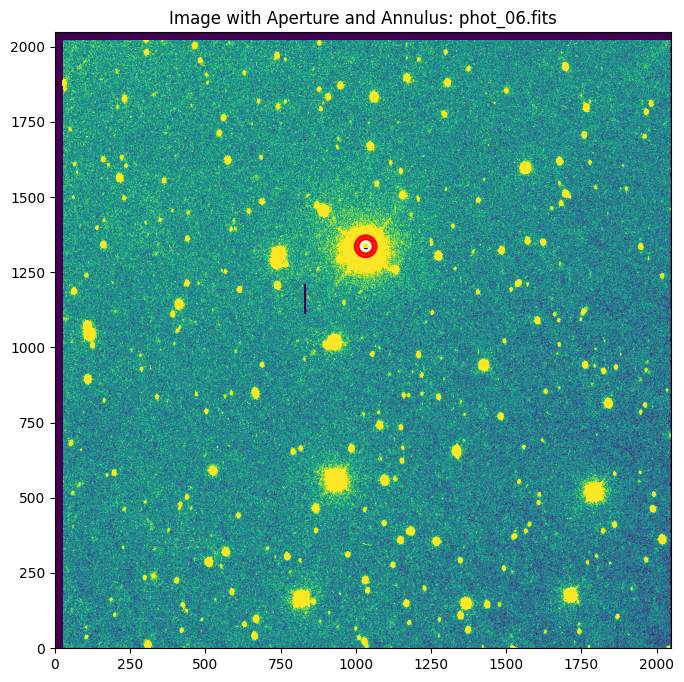

File: phot_07.fits
  EXPTIME: 120.0
  GAIN: 1.62
  Aperture Radius: 15
  Annulus: 25 - 35
  Instrumental Magnitude: 33.662
  Magnitude Error (Estimate): 0.001
  Sky Background (per pixel): 852.807
------------------------------


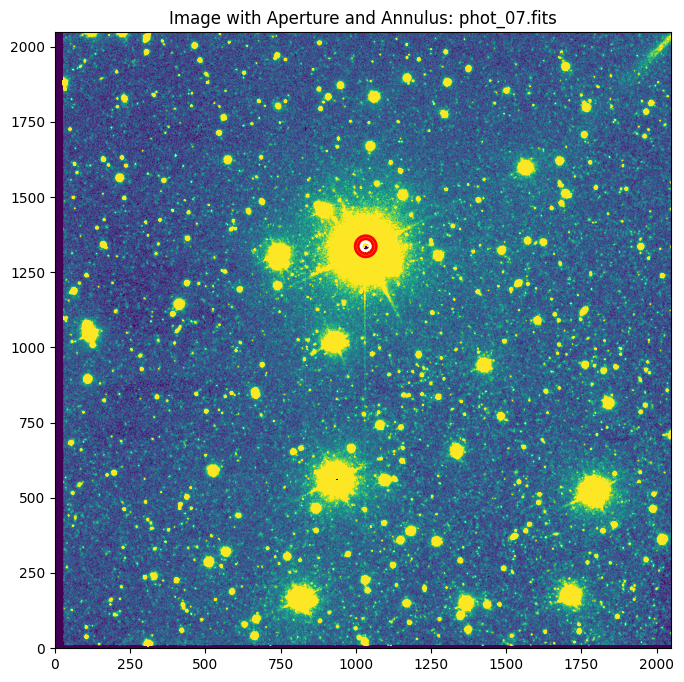

File: phot_08.fits
  EXPTIME: 120.0
  GAIN: 1.62
  Aperture Radius: 15
  Annulus: 25 - 35
  Instrumental Magnitude: 32.363
  Magnitude Error (Estimate): 0.000
  Sky Background (per pixel): 1256.928
------------------------------


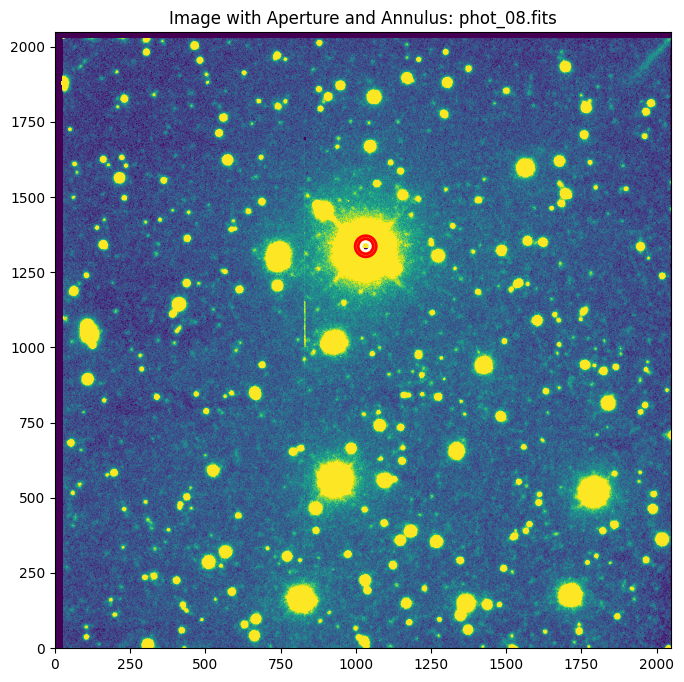

File: phot_09.fits
  EXPTIME: 120.0
  GAIN: 1.62
  Aperture Radius: 15
  Annulus: 25 - 35
  Instrumental Magnitude: 34.548
  Magnitude Error (Estimate): 0.001
  Sky Background (per pixel): 3016.667
------------------------------


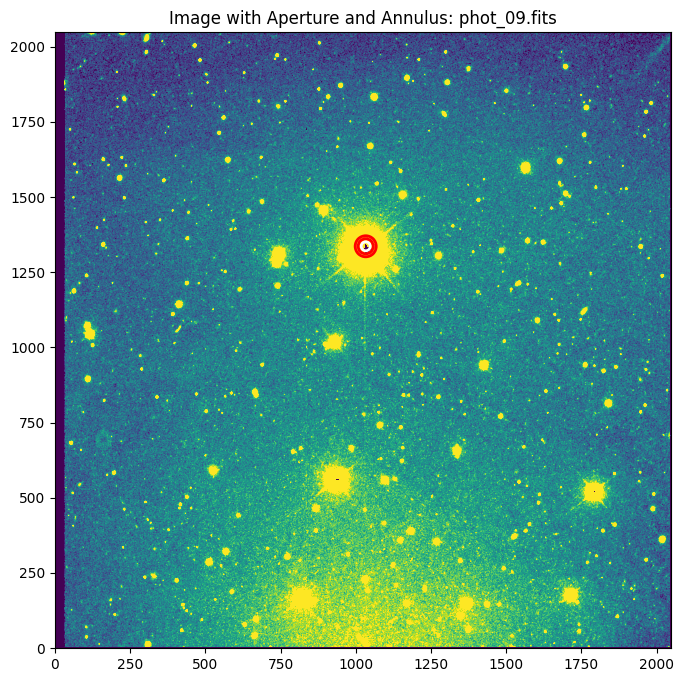

File: phot_10.fits
  EXPTIME: 120.0
  GAIN: 1.62
  Aperture Radius: 15
  Annulus: 25 - 35
  Instrumental Magnitude: 34.460
  Magnitude Error (Estimate): 0.001
  Sky Background (per pixel): 4186.371
------------------------------


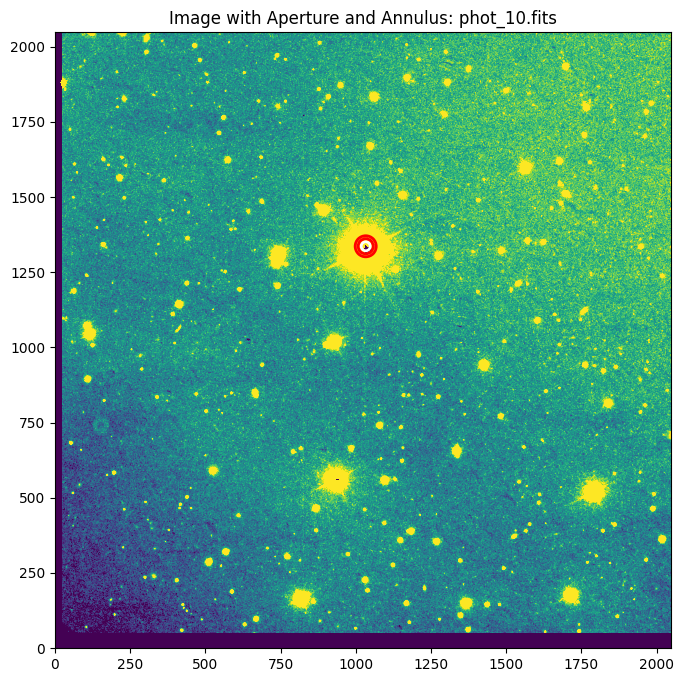

File: phot_11.fits
  EXPTIME: 120.0
  GAIN: 1.62
  Aperture Radius: 15
  Annulus: 25 - 35
  Instrumental Magnitude: 32.517
  Magnitude Error (Estimate): 0.000
  Sky Background (per pixel): 4868.241
------------------------------


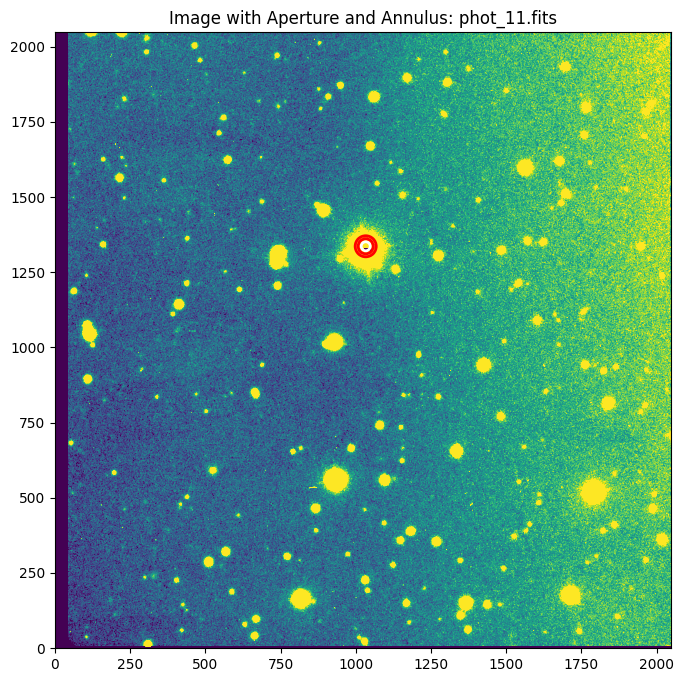

File: phot_12.fits
  EXPTIME: 120.0
  GAIN: 1.62
  Aperture Radius: 15
  Annulus: 25 - 35
  Instrumental Magnitude: 34.129
  Magnitude Error (Estimate): 0.001
  Sky Background (per pixel): 693.079
------------------------------


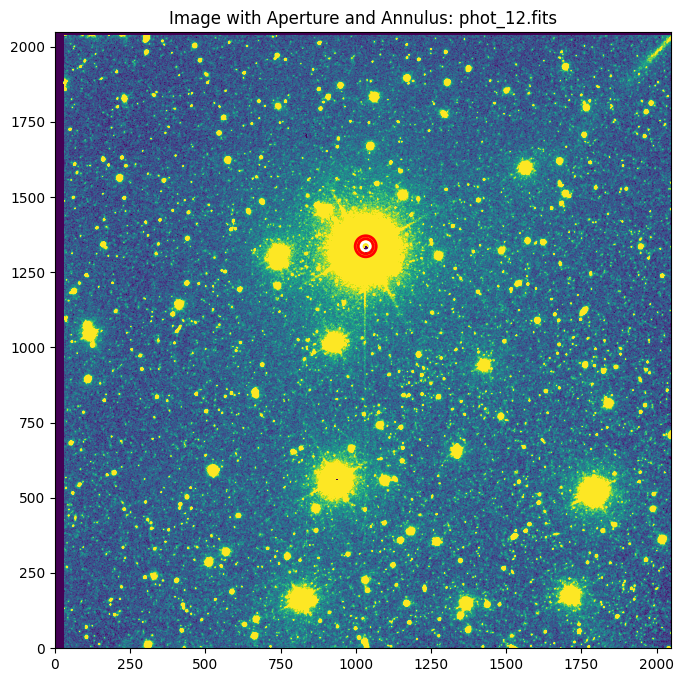

File: phot_13.fits
  EXPTIME: 120.0
  GAIN: 1.62
  Aperture Radius: 15
  Annulus: 25 - 35
  Instrumental Magnitude: 34.133
  Magnitude Error (Estimate): 0.001
  Sky Background (per pixel): 690.562
------------------------------


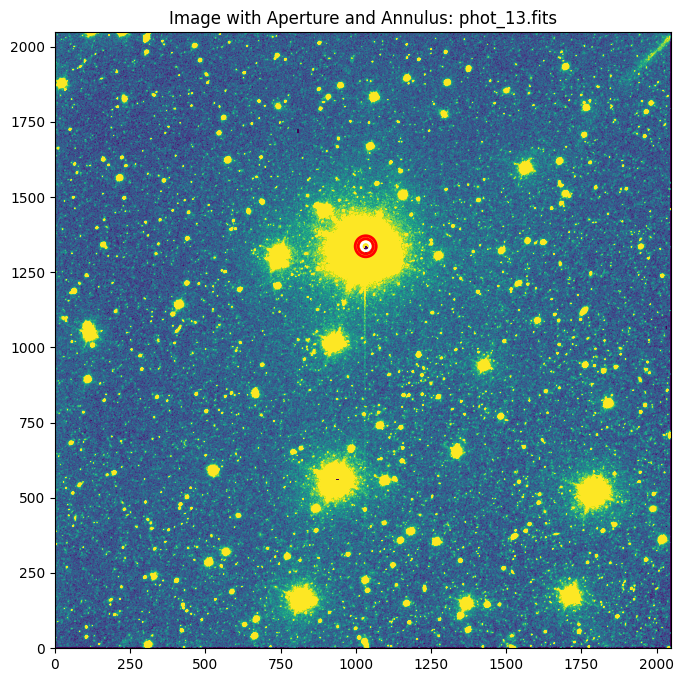

File: phot_14.fits
  EXPTIME: 120.0
  GAIN: 1.62
  Aperture Radius: 15
  Annulus: 25 - 35
  Instrumental Magnitude: 34.275
  Magnitude Error (Estimate): 0.001
  Sky Background (per pixel): 702.492
------------------------------


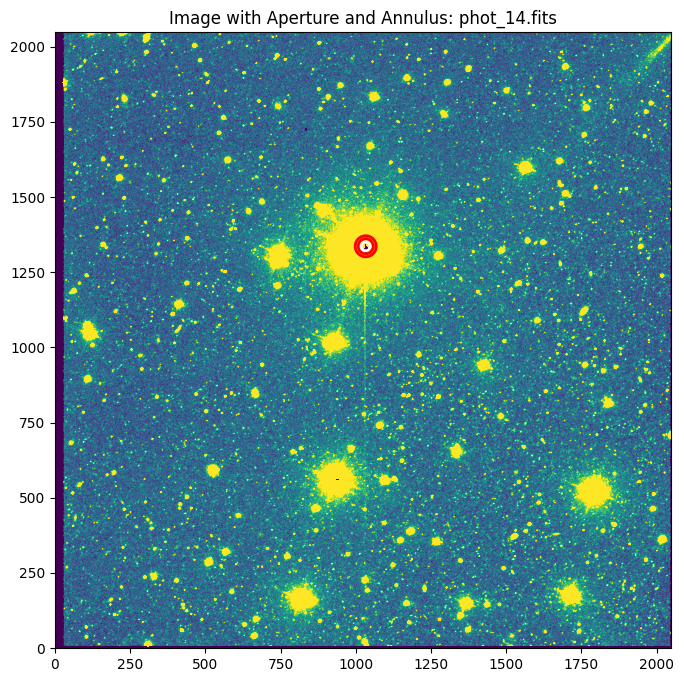

File: phot_15.fits
  EXPTIME: 120.0
  GAIN: 1.62
  Aperture Radius: 15
  Annulus: 25 - 35
  Instrumental Magnitude: 34.052
  Magnitude Error (Estimate): 0.001
  Sky Background (per pixel): 2051.673
------------------------------


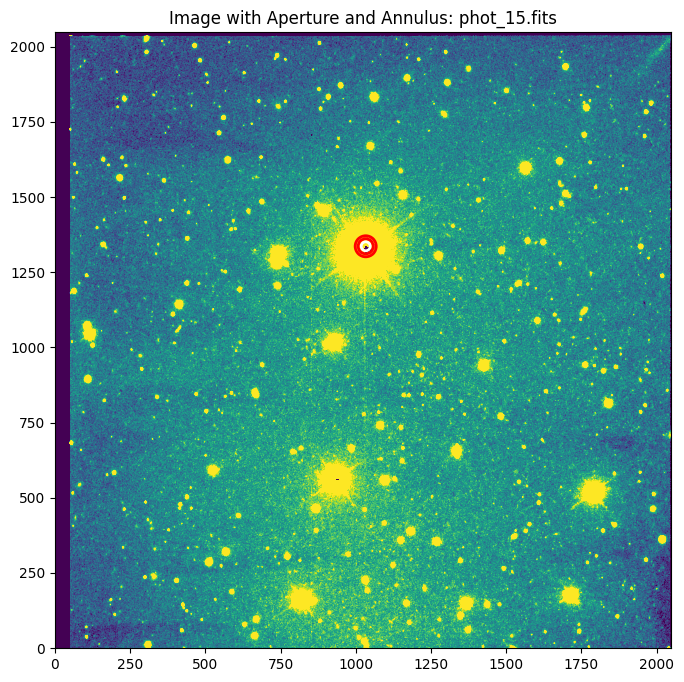

File: phot_16.fits
  EXPTIME: 300.0
  GAIN: 1.62
  Aperture Radius: 15
  Annulus: 25 - 35
  Instrumental Magnitude: 32.777
  Magnitude Error (Estimate): 0.000
  Sky Background (per pixel): 1912.557
------------------------------


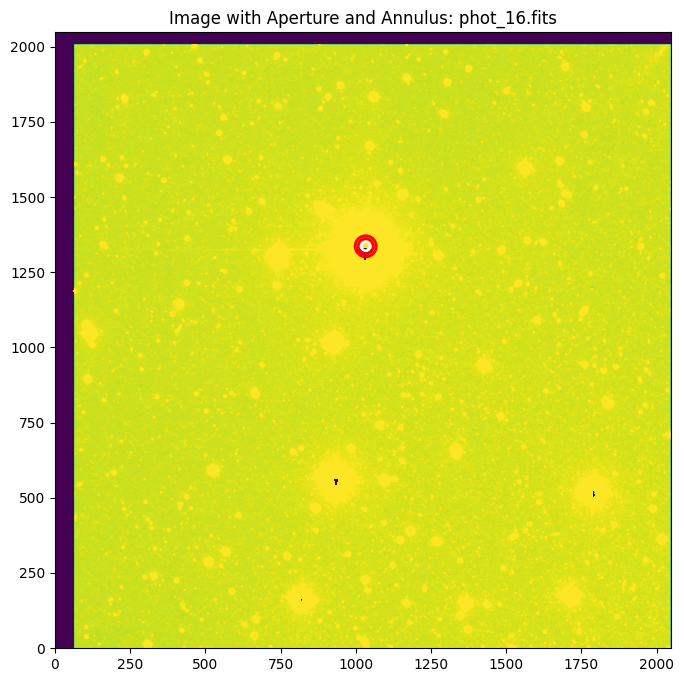

File: phot_17.fits
  EXPTIME: 300.0
  GAIN: 1.62
  Aperture Radius: 15
  Annulus: 25 - 35
  Instrumental Magnitude: 32.537
  Magnitude Error (Estimate): 0.000
  Sky Background (per pixel): 1821.948
------------------------------


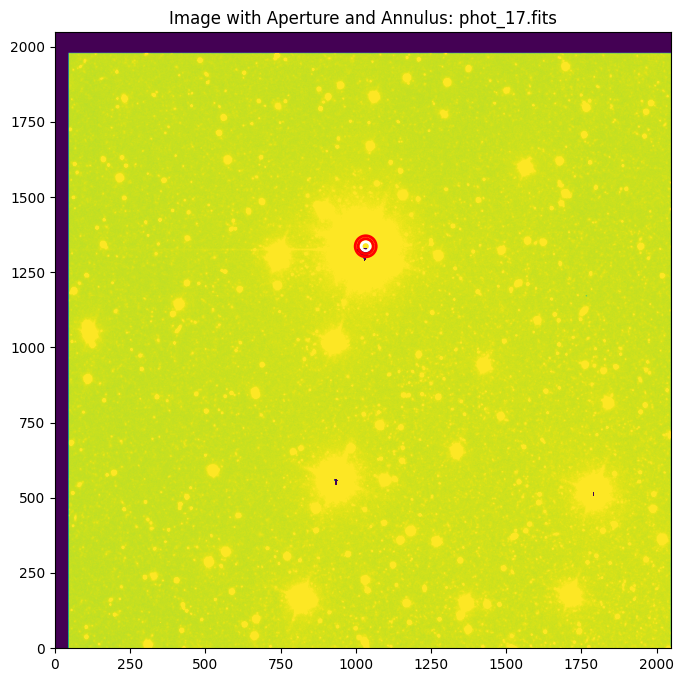

In [7]:
import astropy
from astropy.io import fits
from astropy.stats import sigma_clipped_stats
import matplotlib.pyplot as plt
import numpy as np
import os
from photutils.aperture import CircularAperture, CircularAnnulus, aperture_photometry

wd = r"C:\Users\friesco\workstation\fr-p\studies\ASTRO716\data_excercise"
plt.rcParams['figure.figsize'] = [10, 8]

def aperture_phot(fp, nx, ny):
    try:
        with fits.open(fp) as hdu:
            hdr = hdu[0].header
            img = hdu[0].data
            if img.dtype.byteorder == '>':
                img = img.byteswap().view(img.dtype.newbyteorder('<'))

            exptime = hdr.get('EXPTIME', 1.0)
            gain = hdr.get('GAIN', 1.0)

            ap_rad = 15
            in_ann = 25
            out_ann = 35

            ap = CircularAperture((nx, ny), r=ap_rad)
            ann_ap = CircularAnnulus((nx, ny), r_in=in_ann, r_out=out_ann)

            phot_tbl = aperture_photometry(img, [ap, ann_ap])

            ann_mask = ann_ap.to_mask(method='center')
            ann_data = ann_mask.multiply(img)
            bkg_vals = ann_data[ann_mask.data > 0]
            mean, med, std = sigma_clipped_stats(bkg_vals, sigma=3.0)
            bkg_med = med
            bkg_sum = bkg_med * ap.area

            final_sum = phot_tbl['aperture_sum_0'] - bkg_sum

            if final_sum[0] > 0:
                inst_mag = -2.5 * np.log10(final_sum) + 50
                mag_err = 1.0857 * (np.sqrt(phot_tbl['aperture_sum_0'] + bkg_sum) / phot_tbl['aperture_sum_0'])

                print(f"File: {os.path.basename(fp)}")
                print(f"  EXPTIME: {exptime}")
                print(f"  GAIN: {gain}")
                print(f"  Aperture Radius: {ap_rad}")
                print(f"  Annulus: {in_ann} - {out_ann}")
                print(f"  Instrumental Magnitude: {inst_mag[0]:.3f}")
                print(f"  Magnitude Error (Estimate): {mag_err[0]:.3f}")
                print(f"  Sky Background (per pixel): {bkg_med:.3f}")
                print("-" * 30)
            else:
                print(f"File: {os.path.basename(fp)}")
                print(f"  WARNING: final_sum is not positive ({final_sum[0]:.3f}). Cannot calculate magnitude.")
                print(f"  Sky Background (per pixel): {bkg_med:.3f}")
                print("-" * 30)

            plt.figure(figsize=(8, 8))
            plt.imshow(img, origin='lower', cmap='viridis', vmin=np.percentile(img, 5), vmax=np.percentile(img, 95))
            plt.title(f"Image with Aperture and Annulus: {os.path.basename(fp)}")
            ap.plot(color='white', lw=2)
            ann_ap.plot(color='red', lw=2)
            plt.show()

    except FileNotFoundError:
        print(f"Error: File not found at {fp}")
    except Exception as e:
        print(f"Error processing {fp}: {e}")

phot_files = [f for f in os.listdir(wd) if f.startswith('phot_') and f.endswith('.fits')]
phot_files.sort()

nx = 1033
ny = 1336

for f in phot_files:
    path = os.path.join(wd, f)
    aperture_phot(path, nx, ny)
